In [18]:
import re
import copy
import pandas as pd
import numpy as np
from pyannote.core import Segment, Timeline, Annotation
from pyannote.metrics.identification import *
from pyannote.metrics.detection import *
from IPython.display import Audio

## Annotation range issue
This next cell was intended to test whether generating multiple `Annotation()` objects at the outset (before populating _any_ of them) would provide a workaround for the issue of the visualizations scaling to the largest segment value in memory. (It does not.)

In [11]:
hyp_CoraMommy = Annotation()
hyp_IsaiahAli = Annotation()
hyp_IsaiahJumanji = Annotation()
hyp_PreMathterpieces = Annotation()
hyp_Mathterpieces = Annotation()
hyp_TeacherAri = Annotation()

### CoraMommy
This is a ~16 minute storytime session between an adult female (Anna Long-Slade) and a 27-month-old female (Cora). Anna was reading from a series of storybooks and modifying her voice to align with the characters'. Two characters were male, so Anna dropped her voice accordingly. There were segments of continuous back-and-forth between Cora and Anna. Occasionally an adult male (Tim Slade) made comments or reacted to goings-on, but these were rare.

The recording was made in the early morning when all other members of the household were asleep. It was captured with a microphone positioned within ~1 meter of both participants. The space was a breakfast nook adjacent to a kitchen.

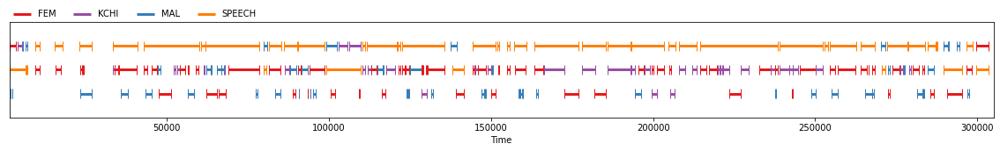

In [9]:
# hyp_CoraMommy = Annotation()
file1 = open('../output_voice_type_classifier/slade_MommyCoraEmotions_16m34s/all.rttm', 'r')
for line in file1:
    parts = line.strip().split(" ")
#     if parts[7] in ["SPEECH", "KCHI", "CHI", "FEM", "MAL"]:
    if parts[7] in ["KCHI", "FEM", "MAL", "SPEECH"]:
        hyp_CoraMommy[Segment(pd.to_numeric(parts[3])*1000, (pd.to_numeric(parts[3])+pd.to_numeric(parts[4]))*1000)] = parts[7]
hyp_CoraMommy

In [ ]:
Audio("/home/leemoore/slade_MommyCoraEmotions_16m34s.wav")

## IsaiahAli
This is a ~5 min. conversation between an adult male (Tim Slade) and a 7-y.o. child (Isaiah) about the child's dog.

The recording was captured on the side of a busy suburban road. The microphone was held in Tim's hand at roughly chest height, which was roughly head height for Isaiah. Isaiah was generally within 2-4 meters of the microphone; Tim was within roughly 0.5 meters of the microphone at all time.

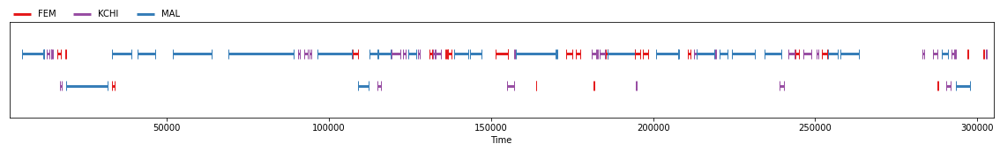

In [8]:
# hyp_IsaiahAli = Annotation()
file2 = open('../output_voice_type_classifier/slade_Streetside01IsaiahReAli/all.rttm', 'r')
for line in file2:
    parts = line.strip().split(" ")
    if parts[7] in ["KCHI", "FEM", "MAL"]:
        hyp_IsaiahAli[Segment(pd.to_numeric(parts[3])*1000, (pd.to_numeric(parts[3])+pd.to_numeric(parts[4]))*1000)] = parts[7]
hyp_IsaiahAli

In [ ]:
Audio("/home/tslade/slade_Streetside01IsaiahReAli.wav")

## IsaiahJumanji
This is a ~5 min. conversation between an adult male (Tim Slade) and a 7-y.o. child (Isaiah) about a movie the child had seen.

The recording was captured partially on the side of a busy suburban road and partially within a quiet housing development. The microphone was held in Tim's hand at roughly chest height, which was roughly head height for Isaiah. Isaiah was generally within 2-4 meters of the microphone; Tim was within roughly 0.5 meters of the microphone at all time.

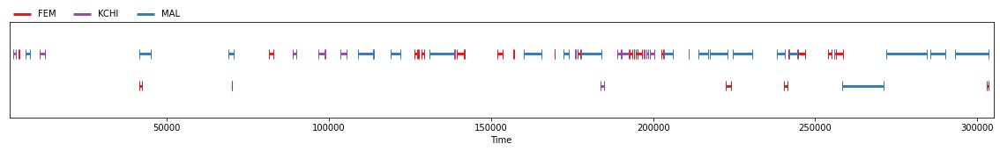

In [7]:
# hyp_IsaiahJumanji = Annotation()
file3 = open('../output_voice_type_classifier/slade_Streetside02IsaiahReJumanji/all.rttm', 'r')
for line in file3:
    parts = line.strip().split(" ")
    if parts[7] in ["KCHI", "FEM", "MAL"]:
        hyp_IsaiahJumanji[Segment(pd.to_numeric(parts[3])*1000, (pd.to_numeric(parts[3])+pd.to_numeric(parts[4]))*1000)] = parts[7]
hyp_IsaiahJumanji

In [ ]:
Audio("/home/tslade/slade_Streetside02IsaiahReJumanji.wav")

## Pre-Mathterpieces
This is a ~45 second session between an adult female (Anna Long-Slade) and several female children aged 10 yrs, 8 yrs, 8 yrs, and 27 months. Anna was asking them to gather around for a reading from a math lesson book requiring the participating children to respond to prompts and generate answers to a puzzle. 

The recording was made in the late morning with a mixer operating in the adjacent room and low levels of noise from the outside. It was captured with a microphone positioned within ~3 meters of all participants. The space was a living room with predominantly hard flooring and walls.

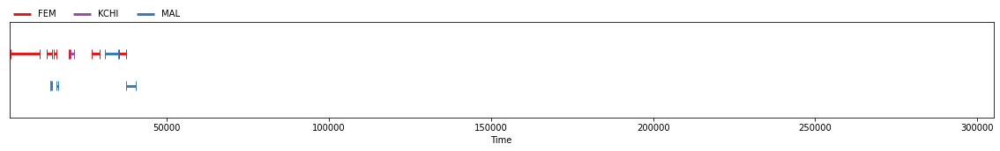

In [6]:
# hyp_PreMathterpieces = Annotation()
file4 = open('../output_voice_type_classifier/slade_LivingRoom01Pre-Mathterpieces/all.rttm', 'r')
for line in file4:
    parts = line.strip().split(" ")
    if parts[7] in ["KCHI", "FEM", "MAL"]:
        hyp_PreMathterpieces[Segment(pd.to_numeric(parts[3])*1000, (pd.to_numeric(parts[3])+pd.to_numeric(parts[4]))*1000)] = parts[7]
hyp_PreMathterpieces

In [ ]:
Audio("/home/tslade/slade_LivingRoom01Pre-Mathterpieces.wav")

## Mathterpieces
This is a ~5 min session between an adult female (Anna Long-Slade) and several female children aged 10 yrs, 8 yrs, 8 yrs, and 27 months. Anna was reading from a math lesson book requiring the participating children to respond to prompts and generate answers to a puzzle. 

The recording was made in the late morning with a mixer operating in the adjacent room and low levels of noise from the outside. It was captured with a microphone positioned within ~3 meters of all participants. The space was a living room with predominantly hard flooring and walls.

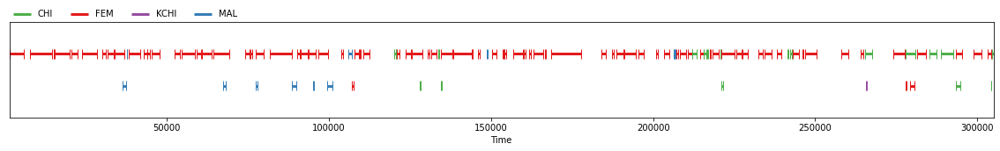

In [3]:
# hyp_Mathterpieces = Annotation()
file5 = open('../output_voice_type_classifier/slade_LivingRoom02Mathterpieces/all.rttm', 'r')
for line in file5:
    parts = line.strip().split(" ")
    if parts[7] in ["KCHI", "FEM", "MAL", "CHI"]:
        hyp_Mathterpieces[Segment(pd.to_numeric(parts[3])*1000, (pd.to_numeric(parts[3])+pd.to_numeric(parts[4]))*1000)] = parts[7]
hyp_Mathterpieces

In [4]:
Audio("/home/tslade/slade_LivingRoom02Mathterpieces.wav")

## TeacherAri
This is a ~2 min session featuring female children aged 10-y.o., 8-y.o., and 27-m.o. A piano is played from approximately 1:05-1:50.

The recording was made in the late morning with low levels of noise from the outside. It was captured with a microphone positioned within ~3 meters of all participants. The space was a living room with predominantly hard flooring and walls.

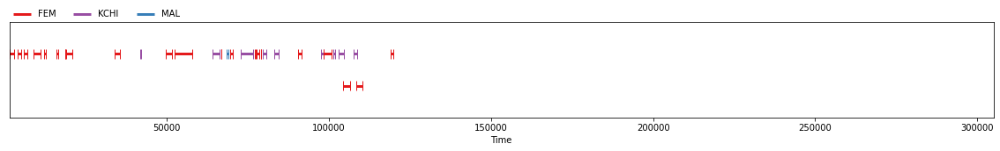

In [5]:
# hyp_TeacherAri = Annotation()
file6 = open('../output_voice_type_classifier/slade_LivingRoom03TeacherAri/all.rttm', 'r')
for line in file6:
    parts = line.strip().split(" ")
    if parts[7] in ["KCHI", "FEM", "MAL"]:
        hyp_TeacherAri[Segment(pd.to_numeric(parts[3])*1000, (pd.to_numeric(parts[3])+pd.to_numeric(parts[4]))*1000)] = parts[7]
hyp_TeacherAri

In [ ]:
Audio("/home/tslade/slade_LivingRoom03TeacherAri.wav")

In [ ]:
hypothesis2.chart()

In [ ]:
list(hypothesis2.itertracks())

In [ ]:
hypothesis2.get_timeline()

In [ ]:
hypothesis2.subset(['KCHI', 'FEM'])

In [ ]:
hypothesis2.update()

In [ ]:
print(hypothesis2)

In [ ]:
!cat ~/miniconda3/envs/pyannote/lib/python3.7/site-packages/pyannote/core/annotation.py

In [ ]:
!wget https://drive.google.com/open?id=19_UewQvC8A7ud77u833og7RFJyw_ROyz&authuser=tslade%40berkeley.edu&usp=drive_fs -O slade_Streetside01IsaiahReAli.mp3

In [ ]:
df = pd.read_csv('../output_voice_type_classifier/slade_MommyCoraEmotions_16m34s/all.rttm',
                 sep=' ',
                 names=['task','inputFile','one','start','duration',
                        'NA_1','NA_2','class','NA_3', 'NA_4'])

In [ ]:
Annotation.__getattribute__

In [ ]:
hyp_TeacherAriFromDF = Annotation()
df = pd.read_csv('../output_voice_type_classifier/slade_LivingRoom03TeacherAri/all.rttm',
                 sep=' ',
                 names=['task','inputFile','one','start','duration',
                        'NA_1','NA_2','class','NA_3', 'NA_4'])

In [ ]:
df[['start', 'duration']] = df[['start','duration']].astype(float)*1000
df['end'] = df['start'] + df['duration']
df = df[['task','inputFile','one','start','duration','end','NA_1','NA_2','class','NA_3','NA_4']]
df.head()

In [ ]:
for i in range(0, len(df[df['start'] < 30000])):
    hyp_TeacherAriFromDF[Segment(df['start'].loc[i],df['end'].loc[i])] = df['class'].loc[i]

In [65]:
mommy_cora = pd.read_csv('../output_voice_type_classifier/slade_MommyCoraEmotions_16m34s/all.rttm',
                         sep=' ',
                        names=['task','inputFile','one','start','duration',
                        'NA_1','NA_2','class','NA_3', 'NA_4'])
pre_math = pd.read_csv('../output_voice_type_classifier/slade_LivingRoom01Pre-Mathterpieces/all.rttm',
                         sep=' ',
                        names=['task','inputFile','one','start','duration',
                        'NA_1','NA_2','class','NA_3', 'NA_4'])
math = pd.read_csv('../output_voice_type_classifier/slade_LivingRoom02Mathterpieces/all.rttm',
                         sep=' ',
                        names=['task','inputFile','one','start','duration',
                        'NA_1','NA_2','class','NA_3', 'NA_4'])
re_ali = pd.read_csv('../output_voice_type_classifier/slade_Streetside01IsaiahReAli/all.rttm',
                         sep=' ',
                        names=['task','inputFile','one','start','duration',
                        'NA_1','NA_2','class','NA_3', 'NA_4'])
re_jumanji = pd.read_csv('../output_voice_type_classifier/slade_Streetside02IsaiahReJumanji/all.rttm',
                         sep=' ',
                        names=['task','inputFile','one','start','duration',
                        'NA_1','NA_2','class','NA_3', 'NA_4'])

In [14]:
mommy_cora

,task,inputFile,one,start,duration,NA_1,NA_2,class,NA_3,NA_4
0,SPEAKER,slade_MommyCoraEmotions_16m34s,1,0.010,3.502,NaN,NaN,FEM,NaN,NaN
1,SPEAKER,slade_MommyCoraEmotions_16m34s,1,0.010,6.500,NaN,NaN,SPEECH,NaN,NaN
2,SPEAKER,slade_MommyCoraEmotions_16m34s,1,0.322,0.688,NaN,NaN,MAL,NaN,NaN
3,SPEAKER,slade_MommyCoraEmotions_16m34s,1,1.824,0.165,NaN,NaN,MAL,NaN,NaN
4,SPEAKER,slade_MommyCoraEmotions_16m34s,1,2.300,0.101,NaN,NaN,MAL,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...
685,SPEAKER,slade_MommyCoraEmotions_16m34s,1,988.983,2.509,NaN,NaN,SPEECH,NaN,NaN
686,SPEAKER,slade_MommyCoraEmotions_16m34s,1,989.012,2.464,NaN,NaN,FEM,NaN,NaN
687,SPEAKER,slade_MommyCoraEmotions_16m34s,1,989.062,0.238,NaN,NaN,MAL,NaN,NaN
688,SPEAKER,slade_MommyCoraEmotions_16m34s,1,992.596,0.780,NaN,NaN,FEM,NaN,NaN


+ Columns should be named START, DUR, and LABEL.
+ For LABEL: Relabel KCHI and CHI as CHILD, and relabel FEM and MAL as ADULT.
+ Subset CHILD and ADULT labels only.
+ Sort by START.
+ Add UTTERANCE (basically the index - 1 through X).
+ Add DUR_TRANS, which is the positive DUR value for CHILD and the negative DUR value for ADULT (this is how we get the diverging y-axis).
+ Add LABEL_NUM, which is 1 for CHILD and -1 for ADULT.

In [63]:
def rttm_to_lollipops(df, outfile=None):
    """ Given an RTTM input file, generate a dataframe structured
        to support a visualization of type {} and optionally
        {export} to a csv located at {outfile}
    """
    # Check whether an outfile has been defined
    if outfile is not None:
        export=True
    
    # Drop the columns we don't care about from a base RTTM
    vizframe = copy.deepcopy(df) \
                   .drop(
                    columns=['task',
                             'inputFile',
                             'one',
                             'NA_1',
                             'NA_2',
                             'NA_3',
                             'NA_4'])
    
    # Rename columns for our viz's purposes
    vizframe = vizframe.rename(columns={
                                'start':'START',
                                'duration':'DUR',
                                'class':'LABEL'
                                })
    
    # Remap the model classes for this viz's purposes
    vizframe['LABEL'] = vizframe['LABEL'].map({
                              'KCHI':'CHILD',
                              'CHI':'CHILD',
                              'FEM':'ADULT',
                              'MAL':'ADULT'
                              })
    
    # Filter the dataframe to just the 'clean' (non-'SPEECH') classes
    vizframe = vizframe[vizframe['LABEL'].isin(['CHILD', 'ADULT'])]
    vizframe['LABEL_NUM'] = vizframe['LABEL'] \
                                     .apply(lambda x: 1 if x=='CHILD'
                                                        else (-1 if x=='ADULT' else NaN))
    vizframe['DUR_TRANS'] = vizframe['LABEL_NUM'] * vizframe['DUR']    

    if export:
        vizframe.to_csv(outfile)

    return vizframe


In [66]:
anna_mc = rttm_to_lollipops(mommy_cora, outfile='./AnnaCoraStoryTimeExport.csv')
red_pre_math = rttm_to_lollipops(pre_math, outfile='./PreMathterpieces.csv')
red_math = rttm_to_lollipops(math, outfile='./Mathterpieces.csv')
red_re_ali = rttm_to_lollipops(re_ali, outfile='./Re_Ali.csv')
red_re_jumanji = rttm_to_lollipops(re_jumanji, outfile='./Re_Jumanji.csv')

In [70]:
!cat Re_Jumanji.csv

,START,DUR,LABEL,LABEL_NUM,DUR_TRANS
0,0.01,0.501,CHILD,1,0.501
1,0.01,1.66,CHILD,1,1.66
3,2.805,0.662,CHILD,1,0.662
4,3.011,0.21600000000000003,CHILD,1,0.21600000000000003
5,3.512,2.98,CHILD,1,2.98
6,4.187,0.324,ADULT,-1,-0.324
7,6.505,1.3430000000000002,ADULT,-1,-1.3430000000000002
8,6.841,0.8390000000000001,CHILD,1,0.8390000000000001
10,9.401,0.292,CHILD,1,0.292
12,10.770999999999999,2.221,CHILD,1,2.221
13,10.798,1.642,CHILD,1,1.642
15,20.576999999999998,0.898,CHILD,1,0.898
17,30.131999999999998,0.861,CHILD,1,0.861
19,41.511,3.4810000000000003,ADULT,-1,-3.4810000000000003
20,41.56100000000001,0.8370000000000001,ADULT,-1,-0.8370000000000001
21,47.574,0.19399999999999998,CHILD,1,0.19399999999999998
22,55.461000000000006,0.96,CHILD,1,0.96
24,59.685,1.807,CHILD,1,1.807
26,68.992,1.7209999999999999,ADULT,-1,-1.7209999999999999
28,70.08,0.111,ADULT,-1,-0.111
31,80.53399999999999,0.655,CHILD,1,0.655
32,81.457,0.5529999999999999,CHILD,1,0.5529999999999999
33,81.493,1.5190000000000001,ADULT,

+ https://stackoverflow.com/questions/44991438/lambda-including-if-elif-else
+ https://stackoverflow.com/questions/48872234/using-apply-in-pandas-lambda-functions-with-multiple-if-statements
+ https://docs.quantifiedcode.com/python-anti-patterns/readability/comparison_to_none.html